# Sentinel-2 Collection 1 comparison

* **Products used:** 
[s2_l2a](https://explorer.digitalearth.africa/s2_l2a)

### Load packages

In [1]:
#!pip uninstall Tools -y
#!pip install ../Tools

In [2]:
%matplotlib inline

import datacube
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from deafrica_tools.datahandling import load_ard
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.plotting import rgb
from odc.algo import geomedian_with_mads

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [3]:
dc = datacube.Datacube(app='s2c1comp')

## Enable Dask

In [4]:
create_local_dask_cluster()

2024-09-20 05:31:22,825 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-zx2t_9bw', purging


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/mickwelli@bigpond.com/proxy/8787/status,
Dashboard: /user/mickwelli@bigpond.com/proxy/8787/status,Workers: 1
Total threads: 2,Total memory: 11.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42519,Workers: 1
Dashboard: /user/mickwelli@bigpond.com/proxy/8787/status,Total threads: 2
Started: Just now,Total memory: 11.21 GiB
Comm: tcp://127.0.0.1:40493,Total threads: 2
Dashboard: /user/mickwelli@bigpond.com/proxy/44229/status,Memory: 11.21 GiB
Nanny: tcp://127.0.0.1:41047,


## Check products

In [5]:
dc_measurements = dc.list_measurements()
dc_measurements.loc['s2_l2a']

,name,dtype,units,nodata,aliases,flags_definition
measurement,,,,,,
B01,B01,uint16,1,0.0,"[band_01, coastal_aerosol]",NaN
B02,B02,uint16,1,0.0,"[band_02, blue]",NaN
B03,B03,uint16,1,0.0,"[band_03, green]",NaN
B04,B04,uint16,1,0.0,"[band_04, red]",NaN
B05,B05,uint16,1,0.0,"[band_05, red_edge_1]",NaN
B06,B06,uint16,1,0.0,"[band_06, red_edge_2]",NaN
B07,B07,uint16,1,0.0,"[band_07, red_edge_3]",NaN
B08,B08,uint16,1,0.0,"[band_08, nir, nir_1]",NaN
B8A,B8A,uint16,1,0.0,"[band_8a, nir_narrow, nir_2]",NaN


In [6]:
dc_measurements = dc.list_measurements()
dc_measurements.loc['s2_l2a_c1']

,name,dtype,units,nodata,aliases,flags_definition
measurement,,,,,,
coastal,coastal,uint16,1,0.0,"[band_01, coastal_aerosol, B01]",NaN
blue,blue,uint16,1,0.0,"[band_02, B02]",NaN
green,green,uint16,1,0.0,"[band_03, B03]",NaN
red,red,uint16,1,0.0,"[band_04, B04]",NaN
rededge1,rededge1,uint16,1,0.0,"[band_05, red_edge_1, B05]",NaN
rededge2,rededge2,uint16,1,0.0,"[band_06, red_edge_2, B06]",NaN
rededge3,rededge3,uint16,1,0.0,"[band_07, red_edge_3, B07]",NaN
nir,nir,uint16,1,0.0,"[band_08, nir_1, B08]",NaN
nir08,nir08,uint16,1,0.0,"[band_8a, nir_narrow, nir_2, B8A]",NaN


## Set area

In [7]:
query = {"x": (-8.05, -8.0), 
         "y": (31.58, 31.63),
         "time": ("2019-09-01", "2019-10-10"),
         "measurements":['red', 'green', 'blue', 'red_edge_1', 'red_edge_2', 'red_edge_3', 'nir_1', 'nir_2', 'swir_1', 'swir_2',  'SCL'],
         "resolution":(-10, 10),
         "output_crs":'EPSG:6933',
         "dask_chunks":{'x':500, 'y':500},
         "group_by":"solar_day",}

## Load original

In [8]:
ds_or = load_ard(dc=dc, products='s2_l2a', **query)

ds_or

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Applying pixel quality/cloud mask
Returning 8 time steps as a dask array


<xarray.Dataset>
Dimensions:      (time: 8, y: 547, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2019-09-04T11:22:31 ... 2019-10-09T11:...
  * y            (y) float64 3.838e+06 3.838e+06 ... 3.833e+06 3.833e+06
  * x            (x) float64 -7.767e+05 -7.767e+05 ... -7.719e+05 -7.719e+05
    spatial_ref  int32 6933
Data variables:
    red          (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_1   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_2   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_3   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    nir_1        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    nir_2        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    swir_1       (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    swir_2       (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    SCL          (time, y, x) uint8 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

## Load C1

In [9]:
ds_c1 = load_ard(dc=dc, products='s2_l2a_c1', **query)

ds_c1

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a_c1
Applying pixel quality/cloud mask
Returning 8 time steps as a dask array


<xarray.Dataset>
Dimensions:      (time: 8, y: 547, x: 483)
Coordinates:
  * time         (time) datetime64[ns] 2019-09-04T11:22:31.727000 ... 2019-10...
  * y            (y) float64 3.838e+06 3.838e+06 ... 3.833e+06 3.833e+06
  * x            (x) float64 -7.767e+05 -7.767e+05 ... -7.719e+05 -7.719e+05
    spatial_ref  int32 6933
Data variables:
    red          (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_1   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_2   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    red_edge_3   (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    nir_1        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    nir_2        (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    swir_1       (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    swir_2       (time, y, x) float32 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
    SCL          (time, y, x) uint8 dask.array<chunksize=(1, 500, 483), meta=np.ndarray>
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

# Plot original

/usr/local/lib/python3.10/dist-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/usr/local/lib/python3.10/dist-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


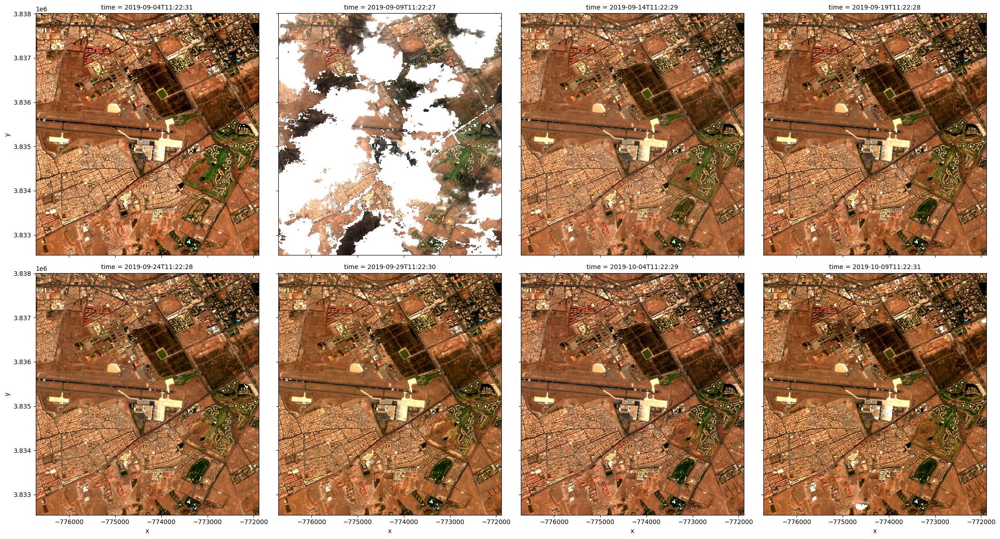

In [10]:
rgb(ds_or, col='time')

/usr/local/lib/python3.10/dist-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


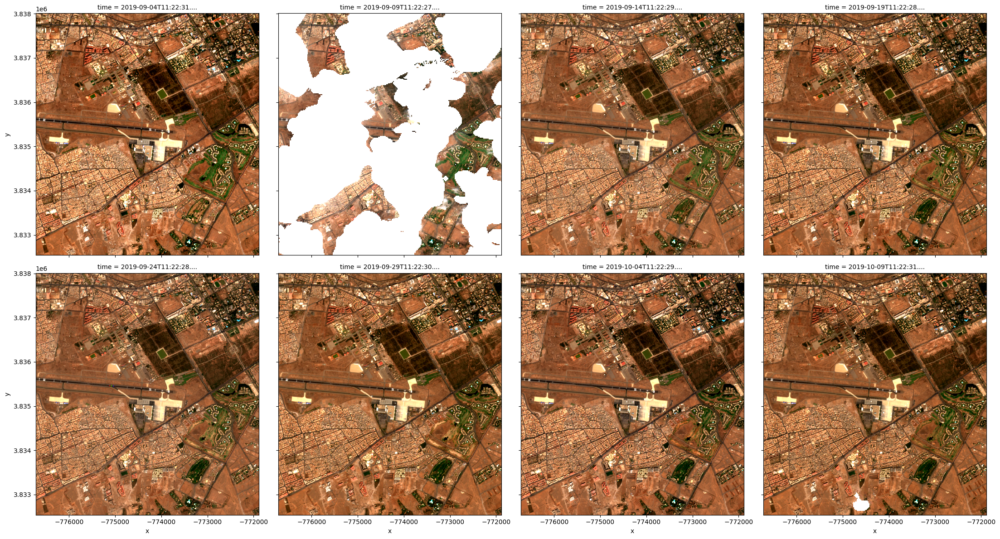

In [11]:
rgb(ds_c1, col='time')

## Plot SCL band

Text(0.5, 1.0, 'Collection 1')

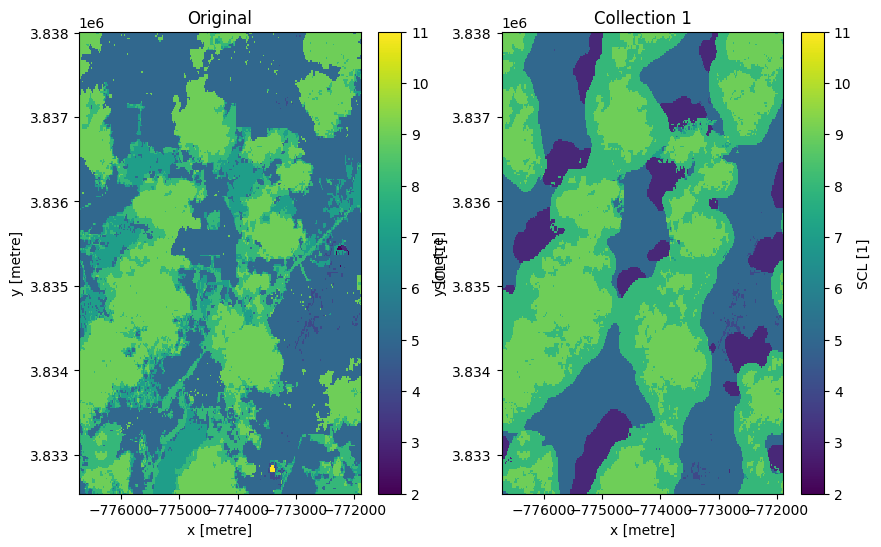

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(10,6))

ds_or.SCL.isel(time=1).plot(ax=ax[0])
ds_c1.SCL.isel(time=1).plot(ax=ax[1], vmin=2, vmax=11)

ax[0].set_title('Original')
ax[1].set_title('Collection 1')

## Run GeoMADs

In [13]:
gm_or = geomedian_with_mads(ds_or,
                               compute_mads=True,
                               compute_count=False).compute()

gm_c1 = geomedian_with_mads(ds_c1,
                               compute_mads=True,
                               compute_count=False).compute()

## Plot GeoMADS

Text(0.5, 1.0, 'Collection 1')

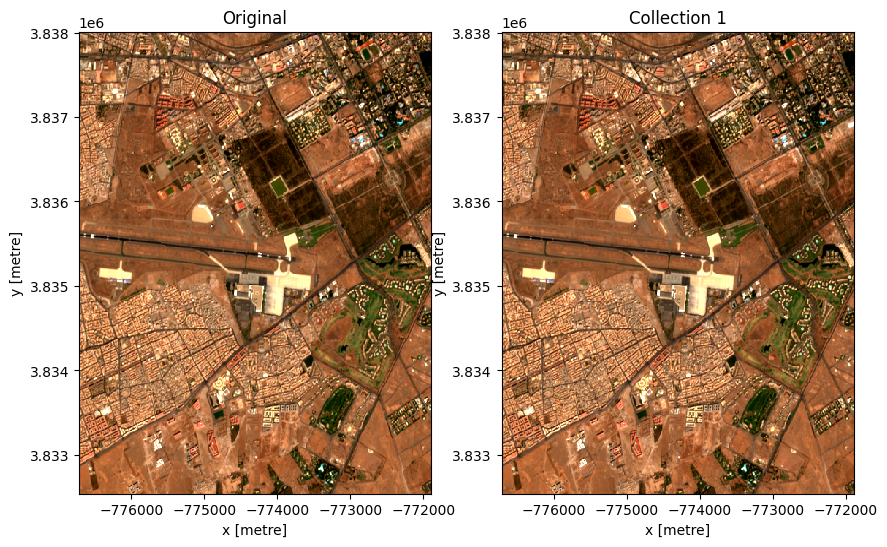

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(10,6))

rgb(gm_or, ax=ax[0])
rgb(gm_c1, ax=ax[1])

ax[0].set_title('Original')
ax[1].set_title('Collection 1')

## Calculate difference and plot RGB

In [15]:
gm_diff = gm_or - gm_c1

gm_diff

<xarray.Dataset>
Dimensions:     (y: 547, x: 483)
Coordinates:
  * y           (y) float64 3.838e+06 3.838e+06 ... 3.833e+06 3.833e+06
  * x           (x) float64 -7.767e+05 -7.767e+05 ... -7.719e+05 -7.719e+05
Data variables: (12/14)
    red         (y, x) float32 -1.016e+03 -1e+03 -993.0 ... -994.8 -985.4 -999.5
    green       (y, x) float32 -1.015e+03 -1.012e+03 ... -998.0 -1.003e+03
    blue        (y, x) float32 -1.016e+03 -1.018e+03 ... -1.001e+03 -1.017e+03
    red_edge_1  (y, x) float32 -1.013e+03 -999.2 -998.6 ... -997.8 -997.9 -999.1
    red_edge_2  (y, x) float32 -1.017e+03 -1.017e+03 ... -997.5 -1.004e+03
    red_edge_3  (y, x) float32 -1.01e+03 -1.012e+03 ... -998.5 -1.003e+03
    ...          ...
    swir_1      (y, x) float32 -1.001e+03 -996.9 -994.3 ... -992.6 -991.9 -992.6
    swir_2      (y, x) float32 -987.1 -997.8 -996.7 ... -993.9 -991.7 -999.8
    SCL         (y, x) float32 0.0 -9.537e-07 0.0 0.0 ... 0.0 0.0 4.768e-07
    smad        (y, x) float32 0.0003163 0.0004316 ... 4.595e-05 2.016e-05
    emad        (y, x) float32 37.4 -4.399 -14.12 -9.245 ... 6.383 7.978 6.317
    bcmad       (y, x) float32 0.008369 0.005036 0.005875 ... 0.002511 0.002593

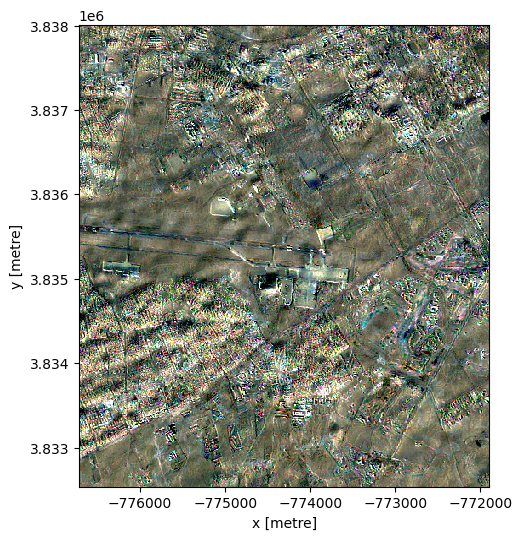

In [16]:
rgb(gm_diff)

## Plot false colour

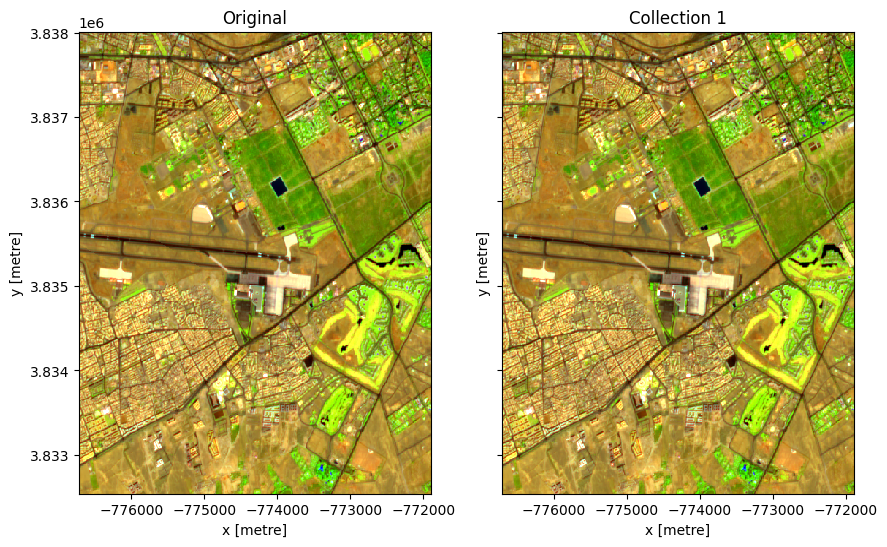

In [17]:
fig,ax=plt.subplots(1,2, sharey=True, figsize=(10,6))
rgb(gm_or,bands=['swir_1','nir_1','green'], ax=ax[0])
rgb(gm_c1, bands=['swir_1','nir_1','green'],ax=ax[1])
ax[0].set_title('Original')
ax[1].set_title('Collection 1');

## Plot MADs

In [18]:
smad_scaling = [np.log(gm_or.smad.quantile(0.02).values), np.log(gm_or.smad.quantile(0.98).values)]
emad_scaling = [np.log(gm_or.emad.quantile(0.02).values), np.log(gm_or.emad.quantile(0.98).values)]
bcmad_scaling = [np.log(gm_or.bcmad.quantile(0.02).values), np.log(gm_or.bcmad.quantile(0.98).values)]

gm_or['smad'] = (np.log(gm_or.smad)-smad_scaling[0])/(smad_scaling[1]- smad_scaling[0])
gm_or['emad'] = (np.log(gm_or.emad)-emad_scaling[0])/(emad_scaling[1]- emad_scaling[0])
gm_or['bcmad'] = (np.log(gm_or.bcmad)-bcmad_scaling[0])/(bcmad_scaling[1]- bcmad_scaling[0])

smad_scaling = [np.log(gm_c1.smad.quantile(0.02).values), np.log(gm_c1.smad.quantile(0.98).values)]
emad_scaling = [np.log(gm_c1.emad.quantile(0.02).values), np.log(gm_c1.emad.quantile(0.98).values)]
bcmad_scaling = [np.log(gm_c1.bcmad.quantile(0.02).values), np.log(gm_c1.bcmad.quantile(0.98).values)]

gm_c1['smad'] = (np.log(gm_c1.smad)-smad_scaling[0])/(smad_scaling[1]- smad_scaling[0])
gm_c1['emad'] = (np.log(gm_c1.emad)-emad_scaling[0])/(emad_scaling[1]- emad_scaling[0])
gm_c1['bcmad'] = (np.log(gm_c1.bcmad)-bcmad_scaling[0])/(bcmad_scaling[1]- bcmad_scaling[0])

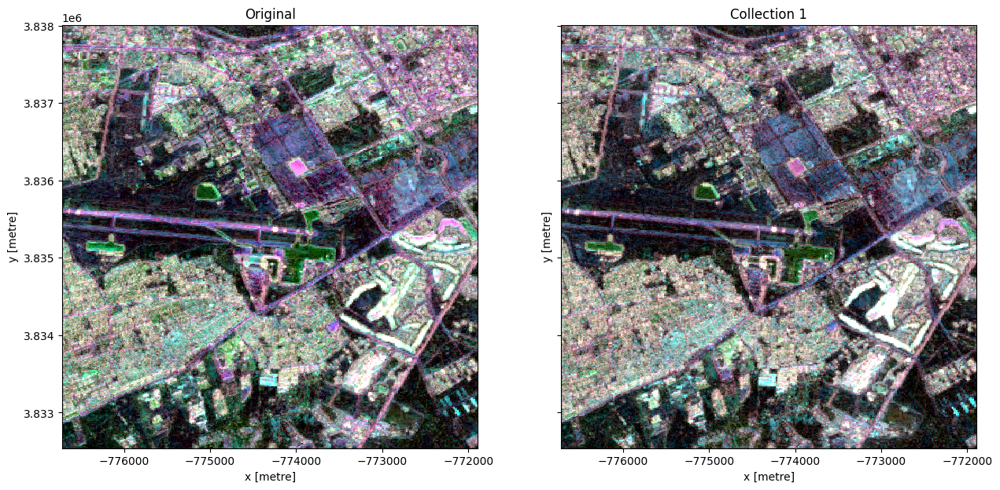

In [19]:
fig,ax=plt.subplots(1,2, sharey=True, figsize=(15,7))
rgb(gm_or,bands=['smad','emad','bcmad'], ax=ax[0])
rgb(gm_c1, bands=['smad','emad','bcmad'],ax=ax[1])
ax[0].set_title('Original')
ax[1].set_title('Collection 1');

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:** 

In [20]:
print(datacube.__version__)

1.8.15


**Last Tested:**

In [21]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2024-09-20'